In [16]:
import os, warnings, math, json, joblib
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [17]:
target_pairs = pd.read_csv("../data/target_pairs.csv")
train_labels = pd.read_csv("../data/train_labels.csv")
train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data/test.csv")
test_labels_lag_1 = pd.read_csv("../data/lagged_test_labels/test_labels_lag_1.csv")
test_labels_lag_2 = pd.read_csv("../data/lagged_test_labels/test_labels_lag_2.csv")
test_labels_lag_3 = pd.read_csv("../data/lagged_test_labels/test_labels_lag_3.csv")
test_labels_lag_4 = pd.read_csv("../data/lagged_test_labels/test_labels_lag_4.csv")

In [18]:
if 'date_id' in train.columns:
    train = train.set_index('date_id')

In [19]:
def create_exchange_dataframes(train):
    lme_cols = []
    jpx_cols = []
    fx_cols = []
    us_cols = []
    for col in train.columns:
        if col.endswith('_Close') or col.endswith('_close'):
            if col.startswith('LME'):
                lme_cols.append(col)
            elif col.startswith('JPX'):
                jpx_cols.append(col)
            elif col.startswith('US'):
                us_cols.append(col)
        if col.startswith('FX'):
            fx_cols.append(col)

    exchanges_data = {
        'US': pd.DataFrame(),
        'LME': pd.DataFrame(),
        'FX': pd.DataFrame(),
        'JPX': pd.DataFrame()
    }
    
    
    if lme_cols:
        exchanges_data['LME'] = train[lme_cols]
    if jpx_cols:
        exchanges_data['JPX'] = train[jpx_cols]
    if fx_cols:
        exchanges_data['FX'] = train[fx_cols]
    if us_cols:
        exchanges_data['US'] = train[us_cols]

    return exchanges_data

EXCHANGES = create_exchange_dataframes(train)

In [20]:
EXCHANGES['LME']

,LME_AH_Close,LME_CA_Close,LME_PB_Close,LME_ZS_Close
date_id,,,,
0,2264.5,7205.0,2570.0,3349.0
1,2228.0,7147.0,2579.0,3327.0
2,2250.0,7188.5,2587.0,3362.0
3,2202.5,7121.0,2540.0,3354.0
4,2175.0,7125.0,2604.0,3386.0
...,...,...,...,...
1956,2629.5,9778.5,2010.0,2818.5
1957,2646.5,9860.0,2014.5,2838.5
1958,2658.5,9919.5,2011.0,2860.0


In [21]:
EXCHANGES['JPX']

,JPX_Gold_Mini_Futures_Close,JPX_Gold_Rolling-Spot_Futures_Close,JPX_Gold_Standard_Futures_Close,JPX_Platinum_Mini_Futures_Close,JPX_Platinum_Standard_Futures_Close,JPX_RSS3_Rubber_Futures_Close
date_id,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,4727.0,4739.0,4730.0,3426.0,3427.0,206.9
3,4778.0,4788.0,4780.0,3486.0,3486.0,204.8
4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
1956,16095.5,16223.0,16090.0,6185.0,6188.0,329.1
1957,NaN,NaN,NaN,NaN,NaN,NaN
1958,16216.0,16345.0,16221.0,6185.0,6182.0,331.9


In [22]:
EXCHANGES['FX']

,FX_AUDJPY,FX_AUDUSD,FX_CADJPY,FX_CHFJPY,FX_EURAUD,FX_EURGBP,FX_EURJPY,FX_EURUSD,FX_GBPAUD,FX_GBPJPY,...,FX_GBPCAD,FX_CADCHF,FX_NZDCAD,FX_NZDCHF,FX_ZAREUR,FX_NOKGBP,FX_NOKCHF,FX_ZARCHF,FX_NOKJPY,FX_ZARGBP
date_id,,,,,,,,,,,,,,,,,,,,,
0,87.933498,0.783393,89.764583,115.545884,1.540368,0.887622,135.449910,1.206713,1.735387,152.598635,...,1.699987,0.776874,0.888115,0.689954,0.066653,0.090582,0.119630,0.078135,13.822740,0.059163
1,88.130730,0.782779,89.731507,115.235160,1.534906,0.889248,135.272384,1.201492,1.726072,152.119947,...,1.695279,0.778682,0.889488,0.692628,0.067354,0.091297,0.120520,0.079066,13.888146,0.059895
2,88.709278,0.786472,90.306741,115.750255,1.535084,0.890830,136.176212,1.207300,1.723206,152.864365,...,1.692724,0.780186,0.894004,0.697490,0.067394,0.091478,0.120809,0.079287,13.983675,0.060037
3,88.971278,0.787461,91.079905,115.976719,1.527972,0.886809,135.945666,1.203219,1.723001,153.297609,...,1.683111,0.785329,0.889439,0.698502,0.067639,0.091558,0.121021,0.079285,14.035571,0.059983
4,88.797150,0.784808,91.136460,115.763578,1.525623,0.882271,135.471018,1.197322,1.729201,153.548140,...,1.684816,0.787264,0.891042,0.701485,0.067443,0.091266,0.121055,0.078925,14.013760,0.059503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1956,96.826934,0.650701,108.351108,185.426044,1.786168,0.866519,172.949203,1.162261,2.061315,199.590857,...,1.842075,0.584336,0.819066,0.478610,0.048581,0.073181,0.078771,0.045312,14.606239,0.042097
1957,96.219554,0.652761,107.778663,184.675863,1.791509,0.866967,172.378229,1.169427,2.066411,198.829159,...,1.844791,0.583610,0.816264,0.476380,0.048547,0.072941,0.078532,0.045315,14.502889,0.042089
1958,96.262192,0.655415,107.954847,185.043787,1.791038,0.868180,172.409286,1.173874,2.062981,198.587085,...,1.839538,0.583402,0.816093,0.476110,0.048495,0.073421,0.078794,0.045184,14.580416,0.042103


In [23]:
EXCHANGES['US']

,US_Stock_ACWI_adj_close,US_Stock_AEM_adj_close,US_Stock_AG_adj_close,US_Stock_AGG_adj_close,US_Stock_ALB_adj_close,US_Stock_AMP_adj_close,US_Stock_BCS_adj_close,US_Stock_BKR_adj_close,US_Stock_BND_adj_close,US_Stock_BNDX_adj_close,...,US_Stock_VWO_adj_close,US_Stock_VXUS_adj_close,US_Stock_VYM_adj_close,US_Stock_WMB_adj_close,US_Stock_WPM_adj_close,US_Stock_X_adj_close,US_Stock_XLB_adj_close,US_Stock_XLE_adj_close,US_Stock_XOM_adj_close,US_Stock_YINN_adj_close
date_id,,,,,,,,,,,,,,,,,,,,,
0,63.673200,39.9057,7.1317,89.513100,119.571200,146.3792,8.2270,25.9966,65.979400,43.456200,...,37.621000,46.227300,68.415500,20.570300,20.1420,35.5499,53.011300,53.147100,60.0402,676.298600
1,63.996900,39.6752,6.9539,89.521300,119.807600,145.6555,8.1972,27.0452,66.036200,43.488200,...,37.983500,46.549600,68.638500,21.138400,20.0065,35.6164,53.382600,53.943100,61.2194,694.503900
2,64.443200,40.0167,6.9638,89.463900,118.380400,146.1896,8.2419,27.9325,66.003800,43.496200,...,38.217100,46.936300,68.941100,21.501700,20.1058,35.9774,53.848900,54.268700,61.3042,702.615100
3,64.863200,40.1534,6.8749,89.406500,119.744000,146.6893,8.0331,27.7792,65.914500,43.496200,...,38.555500,47.250500,69.251600,21.442300,19.8258,36.5664,54.280700,54.247000,61.2547,709.825100
4,64.924400,40.2473,6.8353,89.381900,124.953000,148.1797,8.0853,27.8357,65.922600,43.504200,...,38.563500,47.226300,69.379000,21.521600,19.5368,37.4499,54.358400,54.572600,61.5301,718.837600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1956,130.762340,117.7300,8.2800,98.752085,77.572833,544.5500,18.8800,39.7200,73.083601,49.293645,...,50.635650,69.609297,135.586800,59.848070,88.3200,NaN,90.679470,86.659527,107.7700,45.286777
1957,131.135198,122.6700,8.6900,99.023852,77.653355,534.5100,19.0300,39.8500,73.294274,49.453982,...,50.896400,70.032332,135.506268,58.164055,91.4100,NaN,91.141812,85.762284,108.0500,45.800141
1958,131.356897,128.6200,8.8500,99.215096,83.783088,536.5800,18.9400,40.0200,73.414659,49.494066,...,50.906429,70.324427,136.361927,57.841370,95.7200,NaN,92.398178,86.165539,108.5400,47.622081


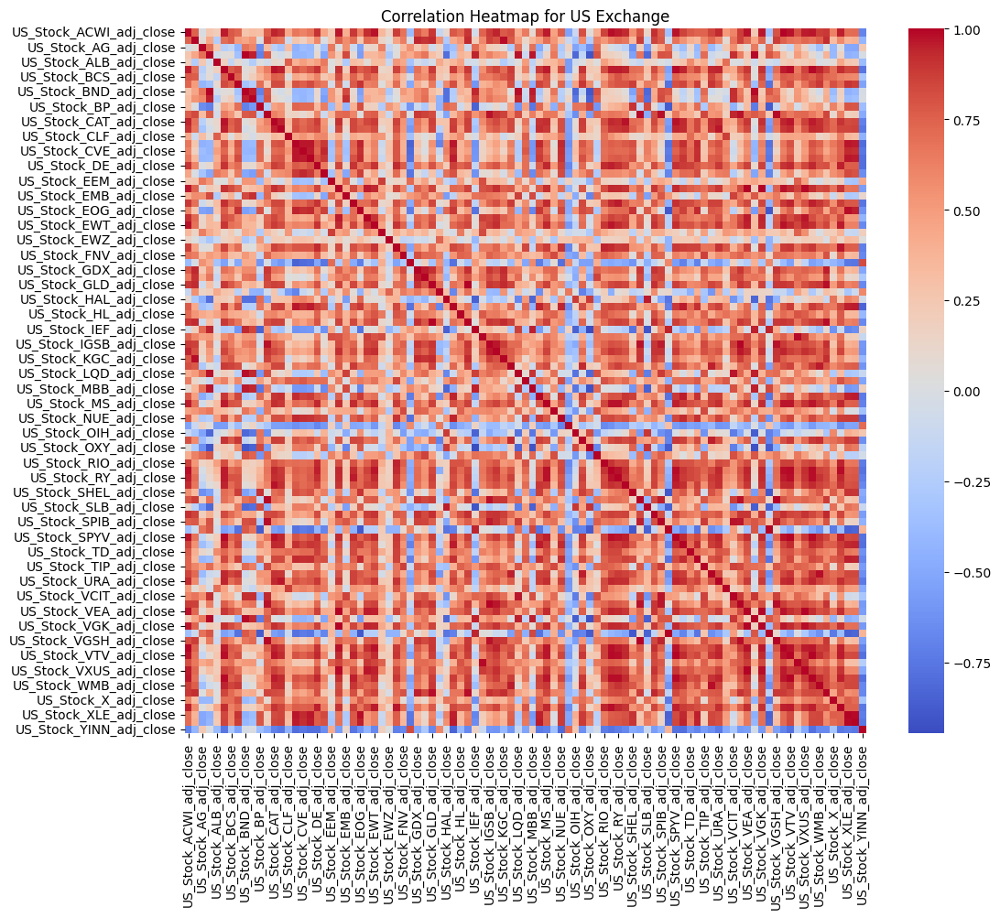

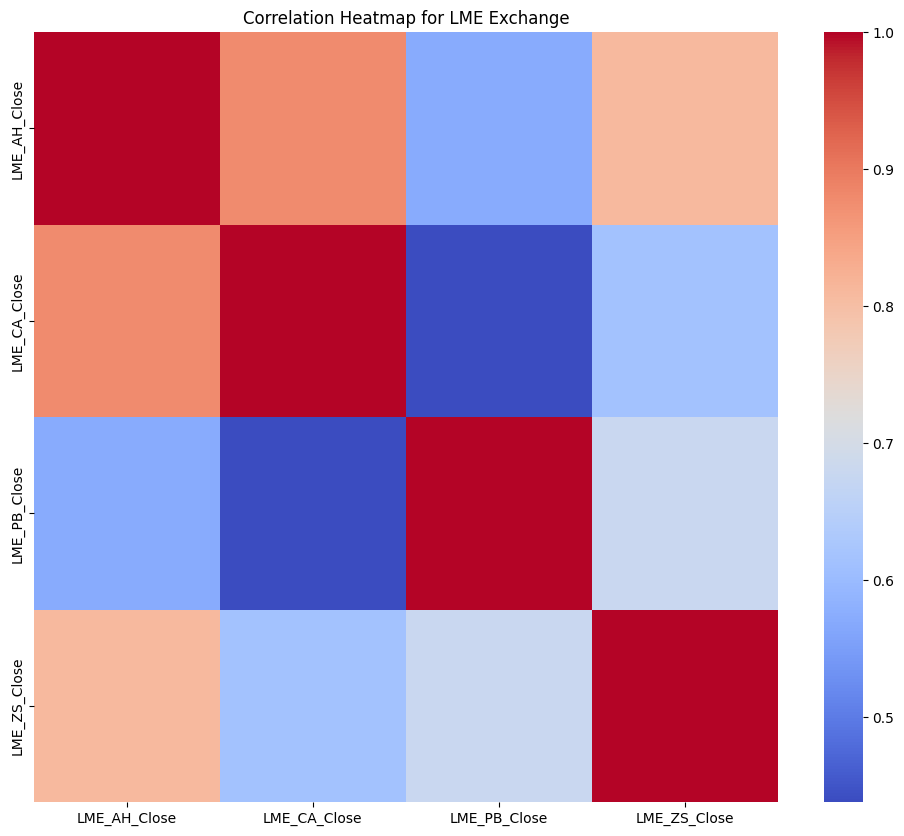

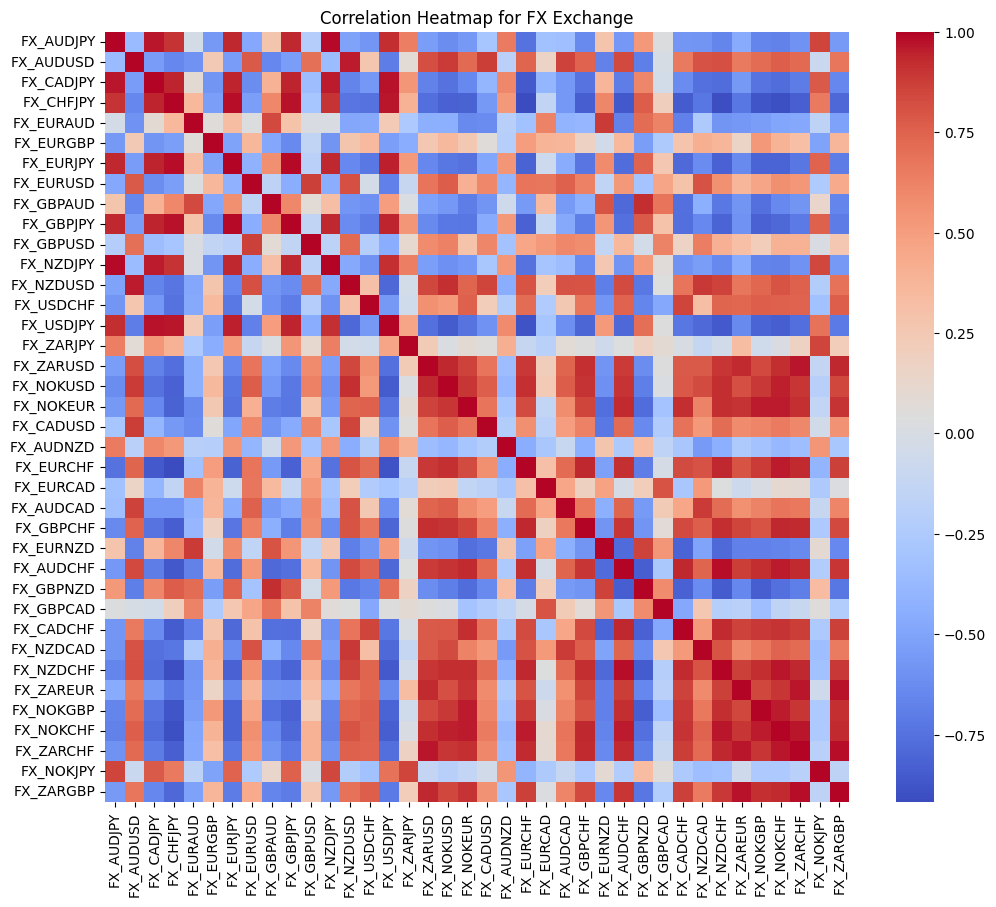

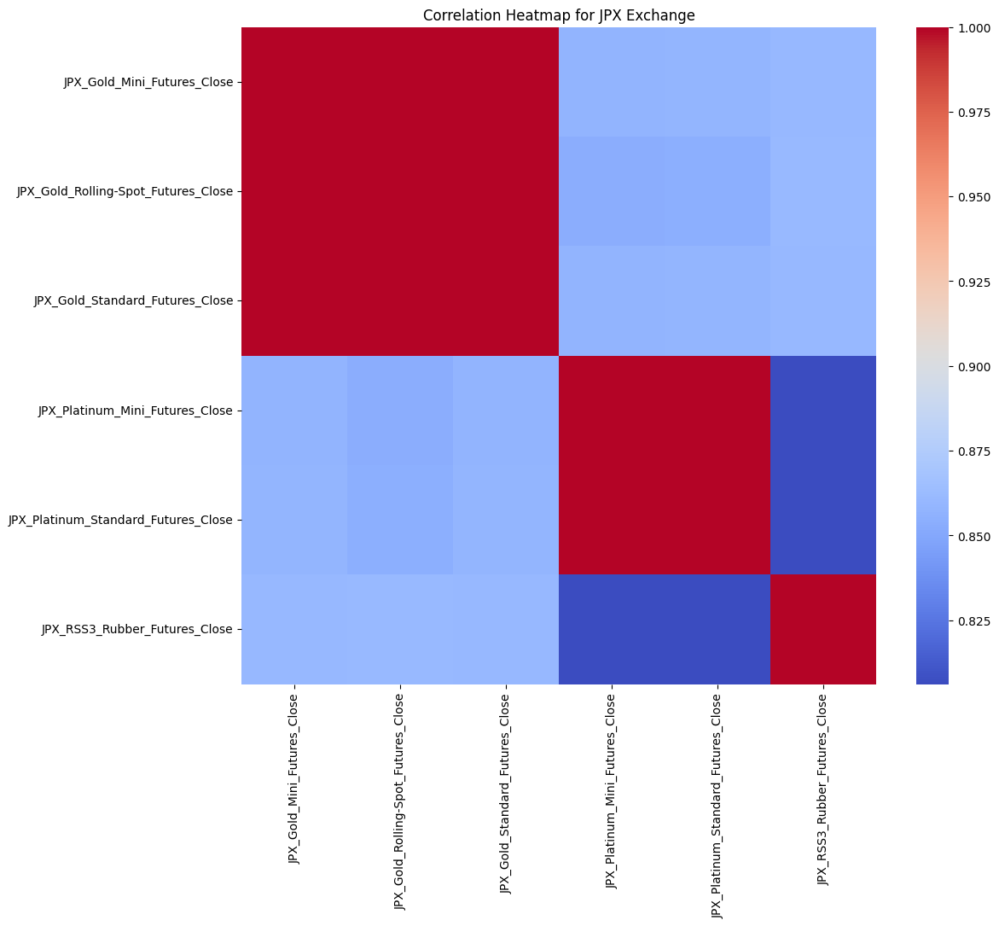

In [24]:
for exchange_name, df in EXCHANGES.items():
    if not df.empty:
        plt.figure(figsize=(12, 10))
        sns.heatmap(df.corr(), annot=False, cmap='coolwarm')
        plt.title(f'Correlation Heatmap for {exchange_name} Exchange')
        plt.show()

In [25]:
for exchange in EXCHANGES:
    display(EXCHANGES[exchange].describe())

,US_Stock_ACWI_adj_close,US_Stock_AEM_adj_close,US_Stock_AG_adj_close,US_Stock_AGG_adj_close,US_Stock_ALB_adj_close,US_Stock_AMP_adj_close,US_Stock_BCS_adj_close,US_Stock_BKR_adj_close,US_Stock_BND_adj_close,US_Stock_BNDX_adj_close,...,US_Stock_VWO_adj_close,US_Stock_VXUS_adj_close,US_Stock_VYM_adj_close,US_Stock_WMB_adj_close,US_Stock_WPM_adj_close,US_Stock_X_adj_close,US_Stock_XLB_adj_close,US_Stock_XLE_adj_close,US_Stock_XOM_adj_close,US_Stock_YINN_adj_close
count,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,...,1894.000000,1894.000000,1894.000000,1894.000000,1894.000000,1869.000000,1894.000000,1894.000000,1894.000000,1894.000000
mean,85.875924,54.679650,8.434381,95.434224,131.905366,258.449130,8.045096,25.806636,70.534871,46.942348,...,39.304192,51.031019,91.954583,27.190238,39.446670,25.313995,68.965540,60.989148,73.052666,218.692851
std,19.087095,19.459634,3.140162,5.455786,65.970536,131.241508,2.944287,7.999838,4.089299,2.342385,...,4.852469,7.327729,20.376943,12.514795,16.440698,11.099320,15.405023,20.356313,27.544335,192.588400
min,49.784100,28.064700,4.189700,85.680700,48.150500,75.652700,3.167900,8.015700,63.362400,42.386800,...,26.122000,31.553400,52.153800,7.001600,14.025500,4.751100,34.713900,19.084400,24.583000,13.703900
25%,66.911225,42.047550,5.995700,90.856950,79.104050,134.767900,6.445150,19.810250,67.129475,44.498325,...,35.834125,44.848850,71.668150,17.868900,25.749500,17.665100,52.018575,45.642225,52.758525,36.758275
50%,86.222250,50.250450,7.298550,94.954900,101.903400,248.274800,7.134000,25.222000,70.088400,47.129300,...,38.280550,50.814750,94.444900,22.417650,39.929300,24.572600,74.267400,55.325150,60.303450,202.635800
75%,97.198150,60.855025,10.341900,100.193975,189.495825,332.325525,8.741600,31.679100,74.074650,49.124250,...,43.724975,57.120075,102.777675,32.042050,46.482200,34.584700,80.974425,81.224300,101.403575,356.214500
max,132.918870,128.620000,21.849400,105.044900,315.363000,571.655500,19.460000,48.308800,77.822600,50.599500,...,51.377784,71.583458,137.569917,63.397610,95.720000,54.850000,96.662600,95.713900,122.121100,969.745900


,LME_AH_Close,LME_CA_Close,LME_PB_Close,LME_ZS_Close
count,1910.000000,1910.000000,1910.000000,1910.000000
mean,2252.202853,7928.229026,2085.848576,2795.022628
std,398.544566,1523.186335,183.154551,445.009643
min,1462.000000,4630.000000,1585.500000,1815.500000
25%,1925.250000,6396.125000,1973.000000,2479.500000
50%,2245.500000,8260.750000,2070.750000,2771.000000
75%,2512.000000,9323.375000,2188.000000,3031.000000
max,3849.000000,10889.000000,2681.000000,4498.500000


,FX_AUDJPY,FX_AUDUSD,FX_CADJPY,FX_CHFJPY,FX_EURAUD,FX_EURGBP,FX_EURJPY,FX_EURUSD,FX_GBPAUD,FX_GBPJPY,...,FX_GBPCAD,FX_CADCHF,FX_NZDCAD,FX_NZDCHF,FX_ZAREUR,FX_NOKGBP,FX_NOKCHF,FX_ZARCHF,FX_NOKJPY,FX_ZARGBP
count,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,...,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000,1961.000000
mean,86.193236,0.695845,93.824472,134.925242,1.611192,0.867078,138.856640,1.119408,1.859271,160.486522,...,1.710787,0.703105,0.856095,0.602847,0.056007,0.082366,0.099372,0.058701,13.096718,0.048583
std,9.354910,0.044247,11.809364,24.917441,0.065779,0.022079,16.265899,0.056739,0.087530,21.196704,...,0.067369,0.049470,0.036205,0.059288,0.005752,0.007005,0.013947,0.009828,0.969003,0.005338
min,62.954694,0.574085,74.973079,107.021462,1.431856,0.823019,114.677383,0.959582,1.663313,125.966010,...,1.472061,0.579407,0.767636,0.466372,0.045552,0.069614,0.076132,0.042087,9.618859,0.039464
25%,78.903011,0.661179,82.979408,112.880050,1.573027,0.851519,126.007425,1.082211,1.791729,143.251306,...,1.684365,0.663481,0.825814,0.546662,0.050591,0.074915,0.084064,0.048954,12.546578,0.043391
50%,84.252585,0.690753,90.148917,122.510222,1.614303,0.862990,131.917633,1.114293,1.841657,153.822948,...,1.713406,0.719225,0.853417,0.615227,0.056036,0.083721,0.101440,0.058030,13.266953,0.048661
75%,94.438016,0.726005,105.917731,164.297203,1.645211,0.883828,156.859605,1.162660,1.917894,182.247068,...,1.743424,0.744981,0.883287,0.649179,0.060573,0.087033,0.109417,0.066195,13.808442,0.052472
max,109.112404,0.812081,118.677507,185.612509,1.886723,0.942938,175.071422,1.251405,2.147899,207.702986,...,1.881218,0.788635,0.950091,0.710020,0.070469,0.094472,0.125403,0.081612,15.314668,0.062025


,JPX_Gold_Mini_Futures_Close,JPX_Gold_Rolling-Spot_Futures_Close,JPX_Gold_Standard_Futures_Close,JPX_Platinum_Mini_Futures_Close,JPX_Platinum_Standard_Futures_Close,JPX_RSS3_Rubber_Futures_Close
count,1845.000000,1845.000000,1845.000000,1845.00000,1845.000000,1845.000000
mean,7698.729268,7763.429268,7699.157182,3792.42439,3794.206504,233.119404
std,3066.764038,3131.926489,3067.132209,723.08661,725.091851,60.659760
min,4173.000000,4220.000000,4174.000000,2182.00000,2180.000000,140.600000
25%,5198.000000,5210.000000,5197.000000,3158.00000,3158.000000,186.600000
50%,6624.000000,6665.000000,6621.000000,3801.00000,3802.000000,222.000000
75%,8952.500000,8982.000000,8953.000000,4327.50000,4329.000000,257.800000
max,16301.000000,16416.000000,16306.000000,6262.50000,6270.000000,412.900000


In [26]:
for exchange in EXCHANGES:
    display(EXCHANGES[exchange].info())

<class 'pandas.core.frame.DataFrame'>
Index: 1961 entries, 0 to 1960
Data columns (total 95 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   US_Stock_ACWI_adj_close  1894 non-null   float64
 1   US_Stock_AEM_adj_close   1894 non-null   float64
 2   US_Stock_AG_adj_close    1894 non-null   float64
 3   US_Stock_AGG_adj_close   1894 non-null   float64
 4   US_Stock_ALB_adj_close   1894 non-null   float64
 5   US_Stock_AMP_adj_close   1894 non-null   float64
 6   US_Stock_BCS_adj_close   1894 non-null   float64
 7   US_Stock_BKR_adj_close   1894 non-null   float64
 8   US_Stock_BND_adj_close   1894 non-null   float64
 9   US_Stock_BNDX_adj_close  1894 non-null   float64
 10  US_Stock_BP_adj_close    1894 non-null   float64
 11  US_Stock_BSV_adj_close   1894 non-null   float64
 12  US_Stock_CAT_adj_close   1894 non-null   float64
 13  US_Stock_CCJ_adj_close   1894 non-null   float64
 14  US_Stock_CLF_adj_close   1894

None

<class 'pandas.core.frame.DataFrame'>
Index: 1961 entries, 0 to 1960
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LME_AH_Close  1910 non-null   float64
 1   LME_CA_Close  1910 non-null   float64
 2   LME_PB_Close  1910 non-null   float64
 3   LME_ZS_Close  1910 non-null   float64
dtypes: float64(4)
memory usage: 76.6 KB


None

<class 'pandas.core.frame.DataFrame'>
Index: 1961 entries, 0 to 1960
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   FX_AUDJPY  1961 non-null   float64
 1   FX_AUDUSD  1961 non-null   float64
 2   FX_CADJPY  1961 non-null   float64
 3   FX_CHFJPY  1961 non-null   float64
 4   FX_EURAUD  1961 non-null   float64
 5   FX_EURGBP  1961 non-null   float64
 6   FX_EURJPY  1961 non-null   float64
 7   FX_EURUSD  1961 non-null   float64
 8   FX_GBPAUD  1961 non-null   float64
 9   FX_GBPJPY  1961 non-null   float64
 10  FX_GBPUSD  1961 non-null   float64
 11  FX_NZDJPY  1961 non-null   float64
 12  FX_NZDUSD  1961 non-null   float64
 13  FX_USDCHF  1961 non-null   float64
 14  FX_USDJPY  1961 non-null   float64
 15  FX_ZARJPY  1961 non-null   float64
 16  FX_ZARUSD  1961 non-null   float64
 17  FX_NOKUSD  1961 non-null   float64
 18  FX_NOKEUR  1961 non-null   float64
 19  FX_CADUSD  1961 non-null   float64
 20  FX_AUDNZD  19

None

<class 'pandas.core.frame.DataFrame'>
Index: 1961 entries, 0 to 1960
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   JPX_Gold_Mini_Futures_Close          1845 non-null   float64
 1   JPX_Gold_Rolling-Spot_Futures_Close  1845 non-null   float64
 2   JPX_Gold_Standard_Futures_Close      1845 non-null   float64
 3   JPX_Platinum_Mini_Futures_Close      1845 non-null   float64
 4   JPX_Platinum_Standard_Futures_Close  1845 non-null   float64
 5   JPX_RSS3_Rubber_Futures_Close        1845 non-null   float64
dtypes: float64(6)
memory usage: 107.2 KB


None


Missing values for US Exchange:
US_Stock_ACWI_adj_close    67
US_Stock_AEM_adj_close     67
US_Stock_AG_adj_close      67
US_Stock_AGG_adj_close     67
US_Stock_ALB_adj_close     67
                           ..
US_Stock_X_adj_close       92
US_Stock_XLB_adj_close     67
US_Stock_XLE_adj_close     67
US_Stock_XOM_adj_close     67
US_Stock_YINN_adj_close    67
Length: 95, dtype: int64


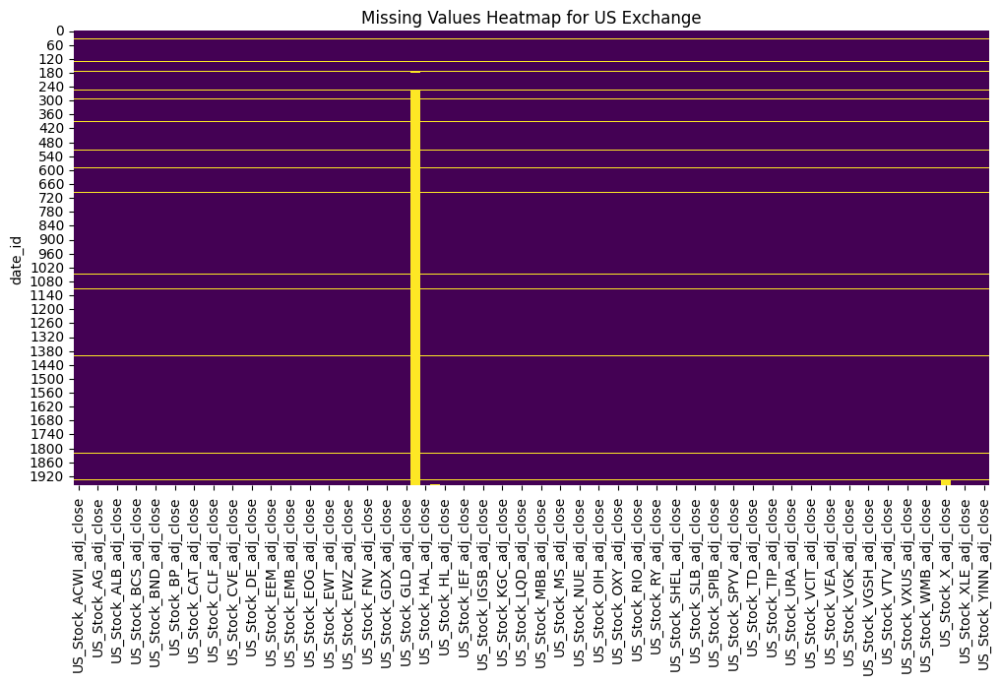


Missing values for LME Exchange:
LME_AH_Close    51
LME_CA_Close    51
LME_PB_Close    51
LME_ZS_Close    51
dtype: int64


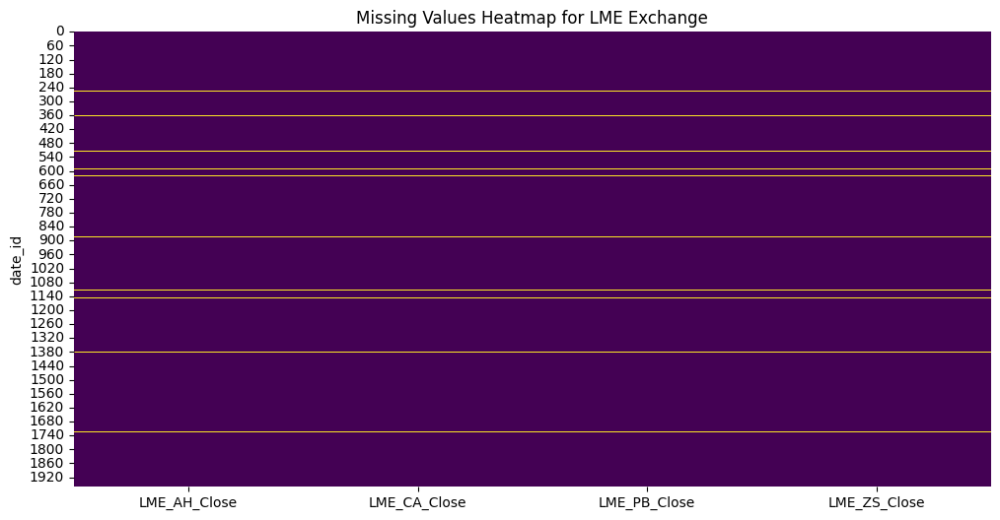


Missing values for FX Exchange:
FX_AUDJPY    0
FX_AUDUSD    0
FX_CADJPY    0
FX_CHFJPY    0
FX_EURAUD    0
FX_EURGBP    0
FX_EURJPY    0
FX_EURUSD    0
FX_GBPAUD    0
FX_GBPJPY    0
FX_GBPUSD    0
FX_NZDJPY    0
FX_NZDUSD    0
FX_USDCHF    0
FX_USDJPY    0
FX_ZARJPY    0
FX_ZARUSD    0
FX_NOKUSD    0
FX_NOKEUR    0
FX_CADUSD    0
FX_AUDNZD    0
FX_EURCHF    0
FX_EURCAD    0
FX_AUDCAD    0
FX_GBPCHF    0
FX_EURNZD    0
FX_AUDCHF    0
FX_GBPNZD    0
FX_GBPCAD    0
FX_CADCHF    0
FX_NZDCAD    0
FX_NZDCHF    0
FX_ZAREUR    0
FX_NOKGBP    0
FX_NOKCHF    0
FX_ZARCHF    0
FX_NOKJPY    0
FX_ZARGBP    0
dtype: int64


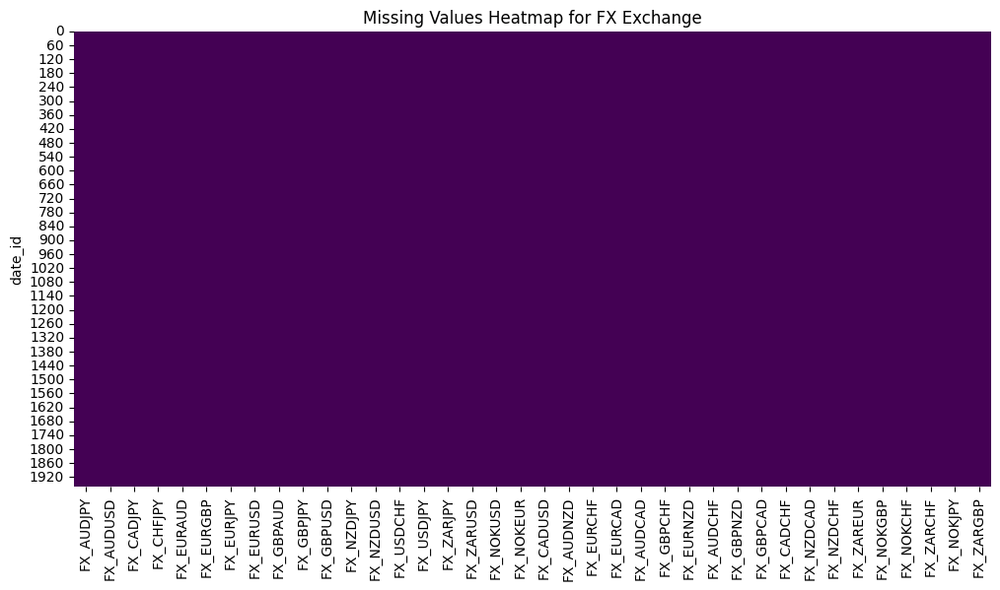


Missing values for JPX Exchange:
JPX_Gold_Mini_Futures_Close            116
JPX_Gold_Rolling-Spot_Futures_Close    116
JPX_Gold_Standard_Futures_Close        116
JPX_Platinum_Mini_Futures_Close        116
JPX_Platinum_Standard_Futures_Close    116
JPX_RSS3_Rubber_Futures_Close          116
dtype: int64


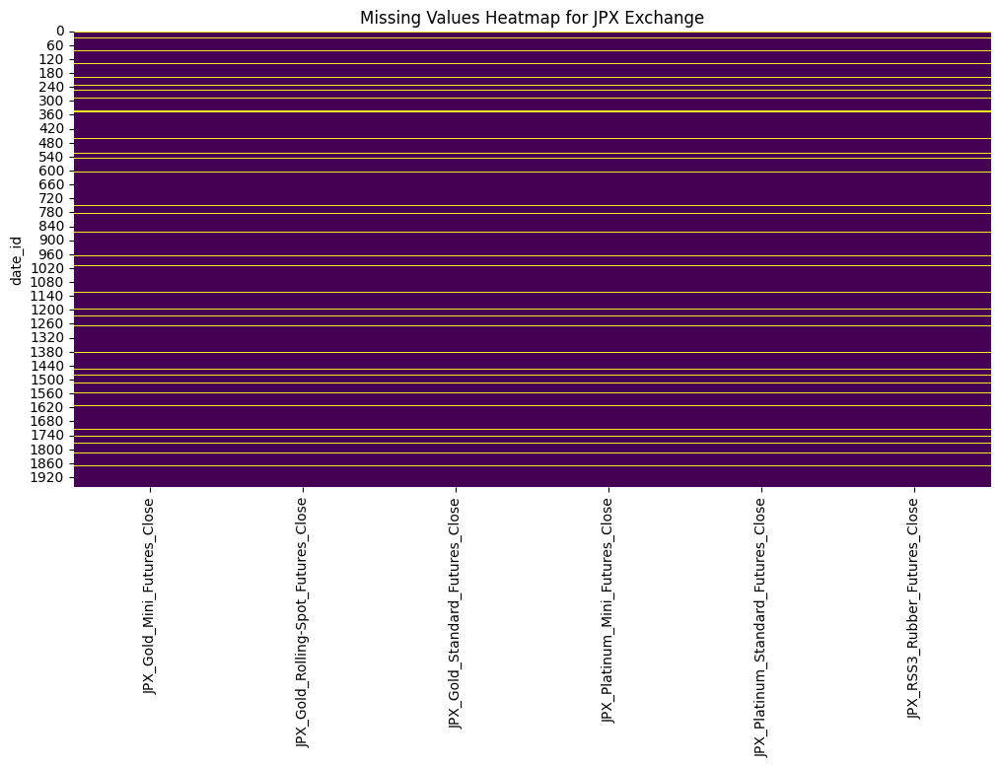

In [27]:
for exchange_name, df in EXCHANGES.items():
    if not df.empty:
        print(f"\nMissing values for {exchange_name} Exchange:")
        print(df.isnull().sum())

        plt.figure(figsize=(12, 6))
        sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
        plt.title(f'Missing Values Heatmap for {exchange_name} Exchange')
        plt.show()

In [28]:
# US_Stock_GOLD_adj_close has too many null values, hence dropped

In [29]:
if 'US_Stock_GOLD_adj_close' in EXCHANGES['US'].columns:
    EXCHANGES['US'] = EXCHANGES['US'].drop(columns=['US_Stock_GOLD_adj_close'])
EXCHANGES['US'].shape    

(1961, 94)


--- Plotting All Stocks on One Figure Per Exchange ---


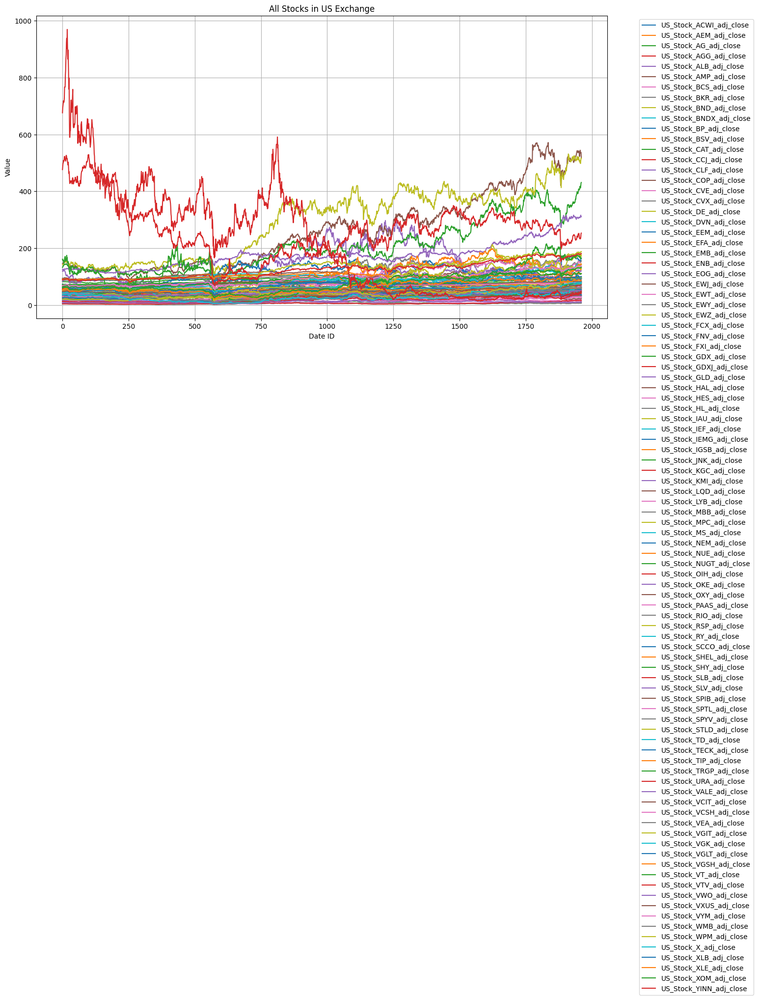

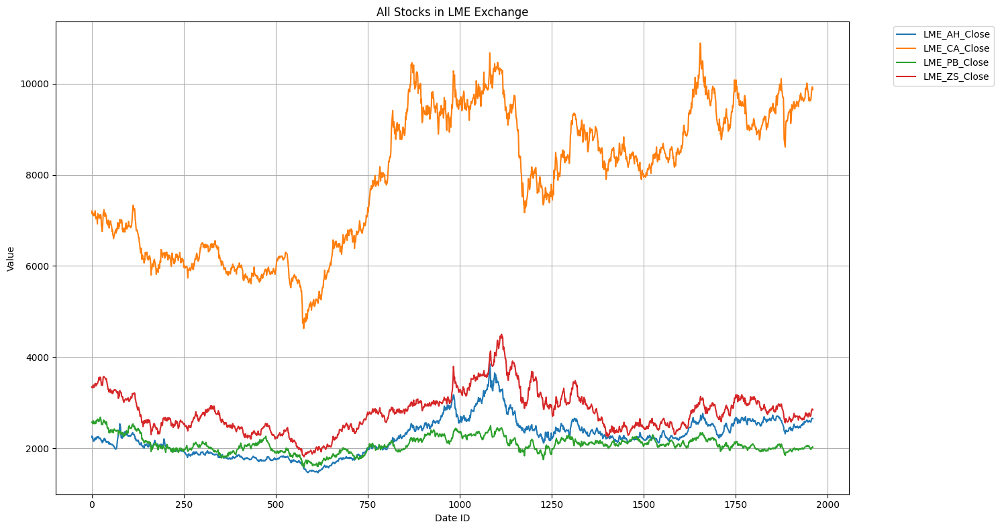

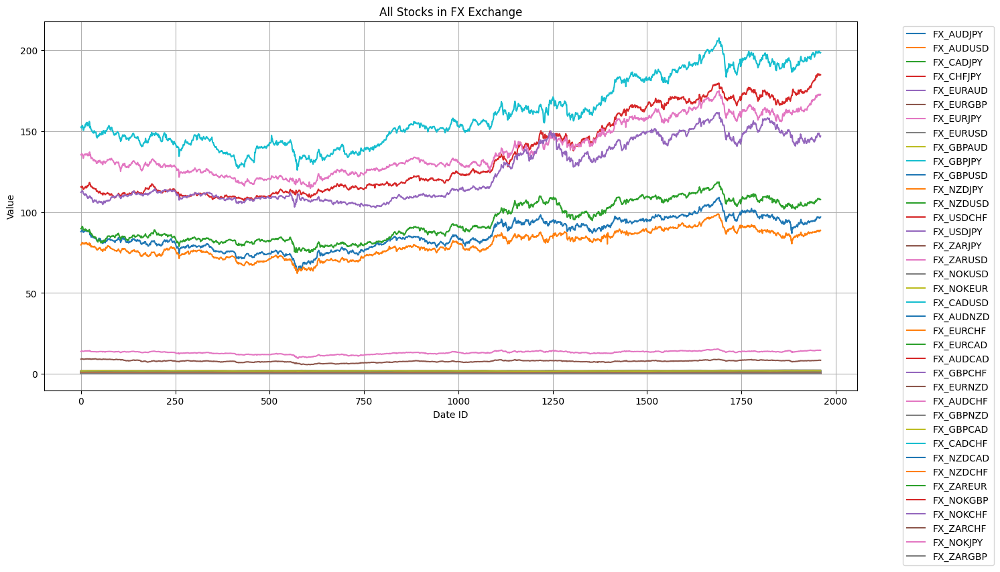

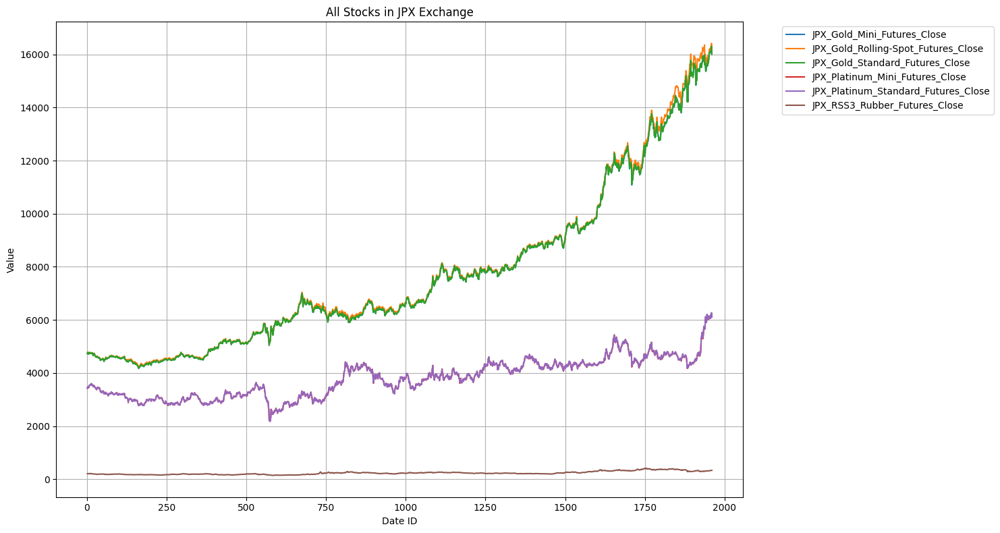


--- Plotting Individual Stock Figures Per Exchange ---

Plots for US Exchange:


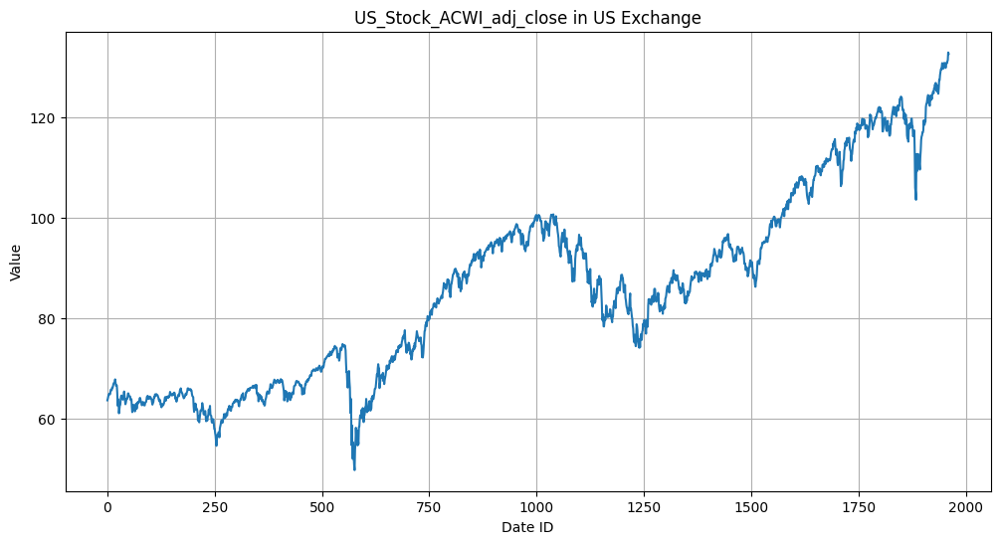

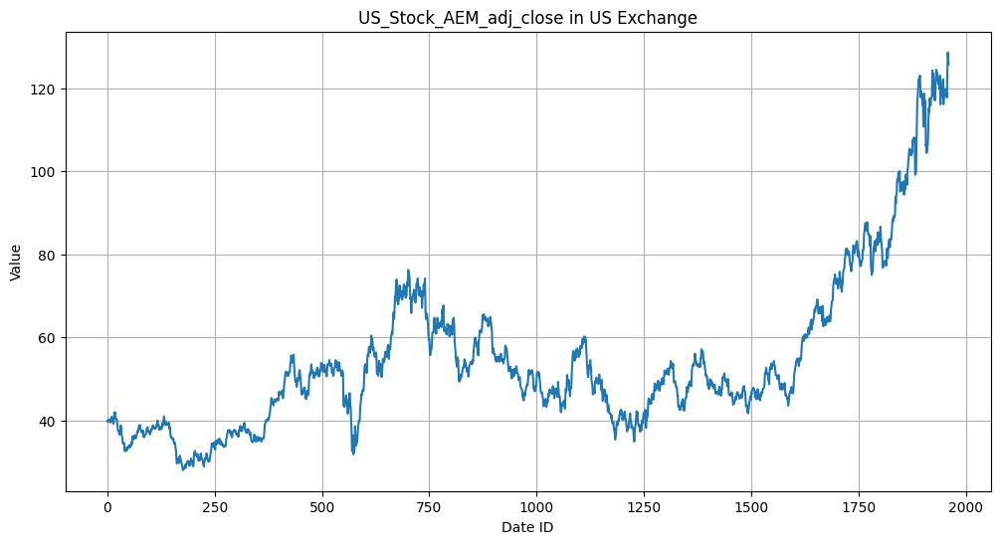

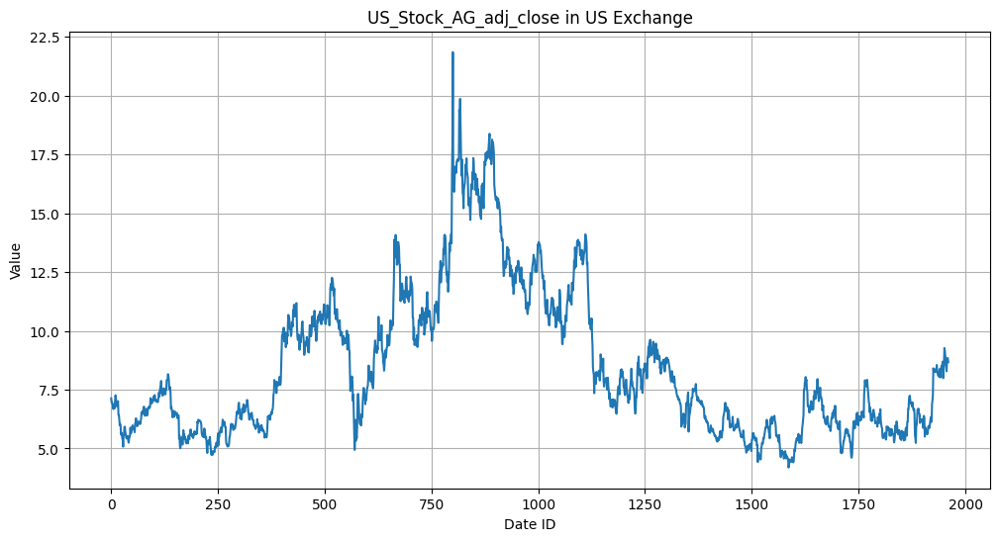

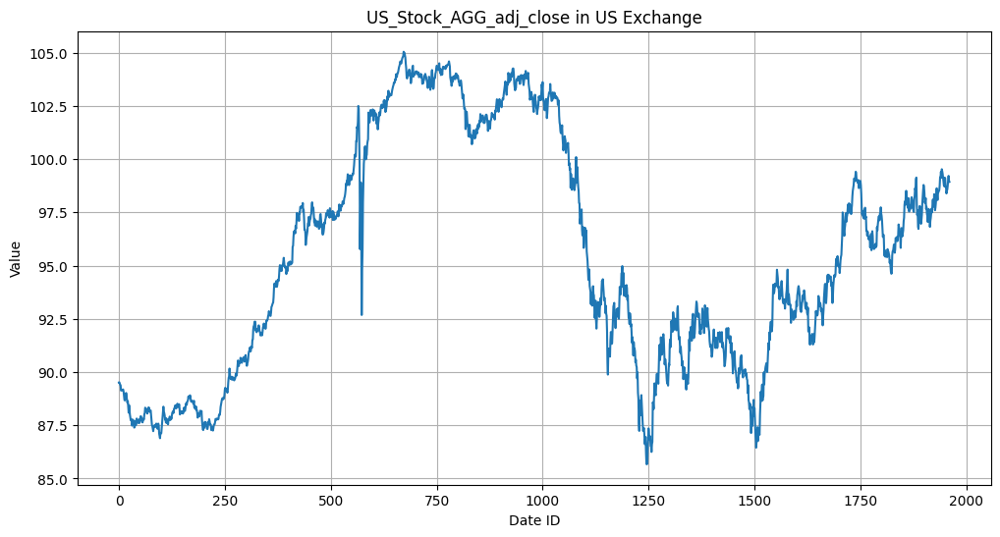

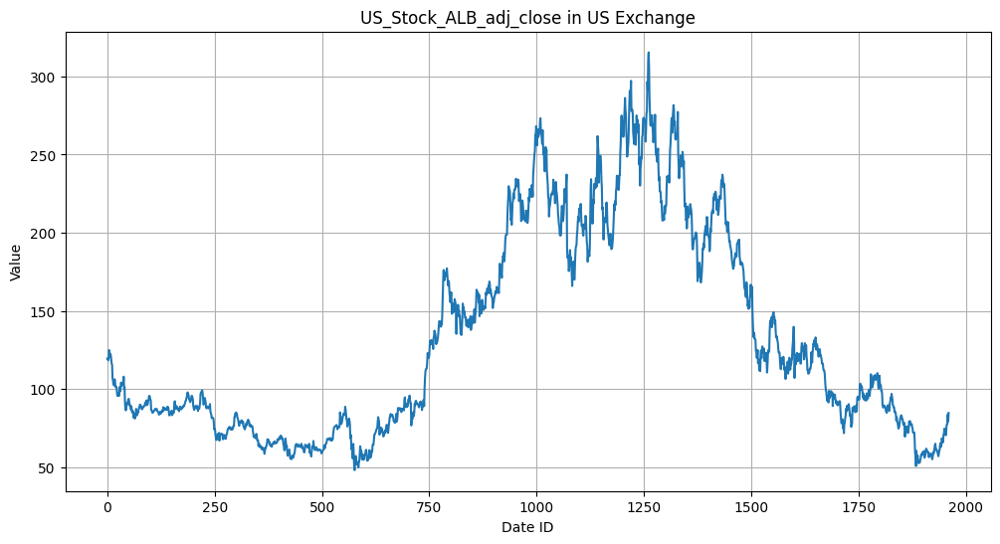

...

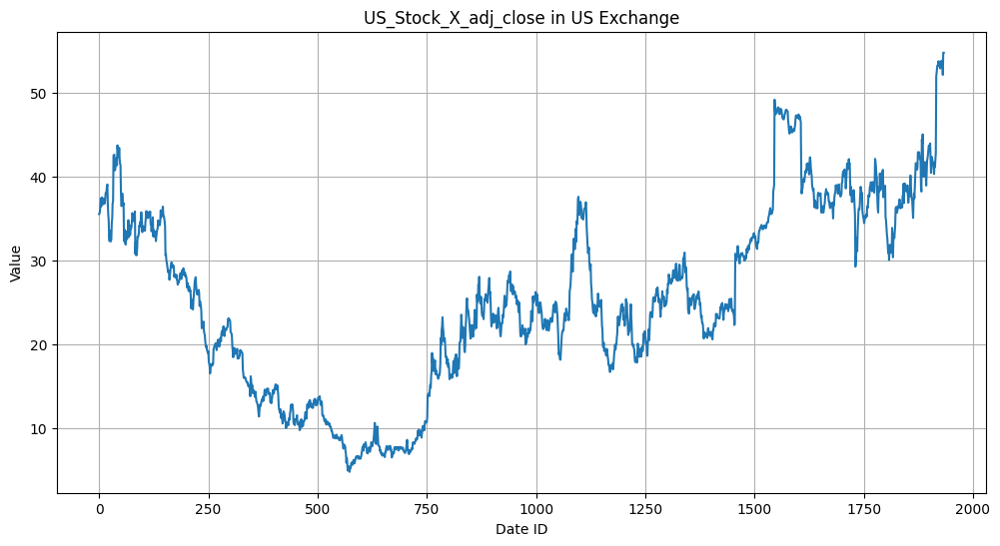

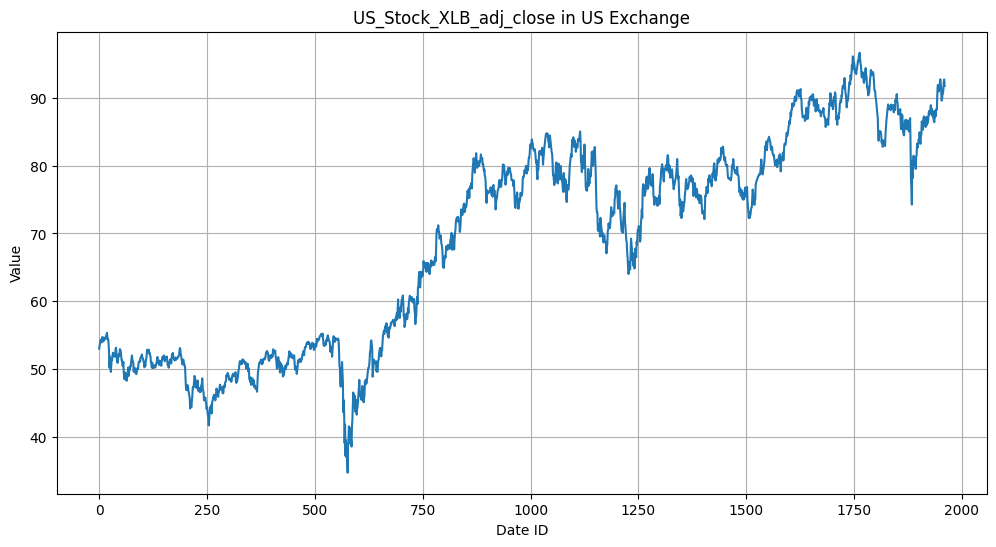

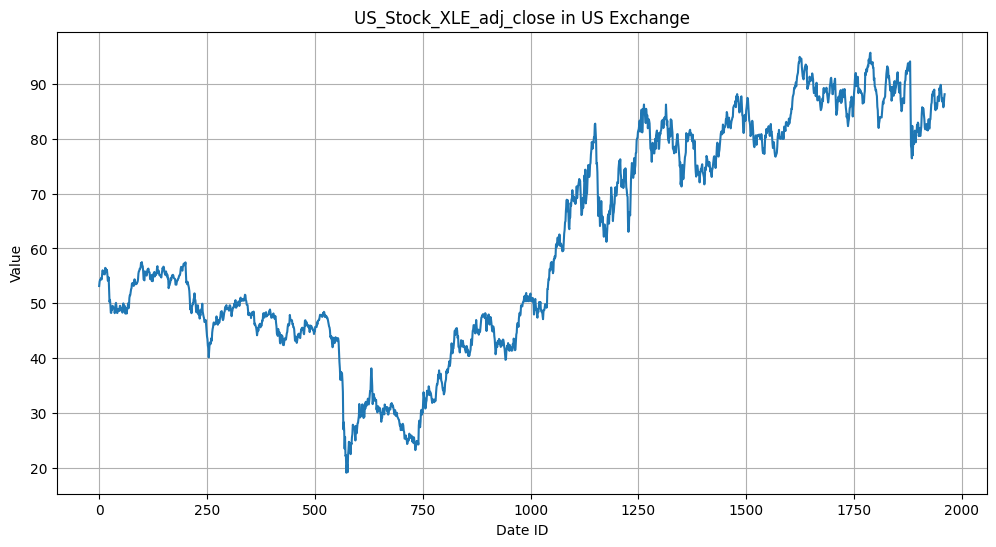

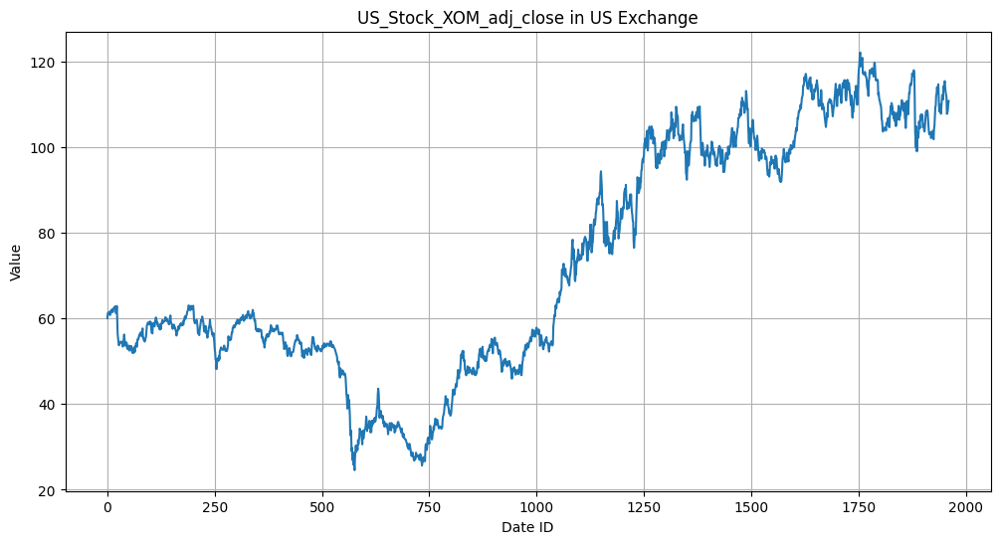

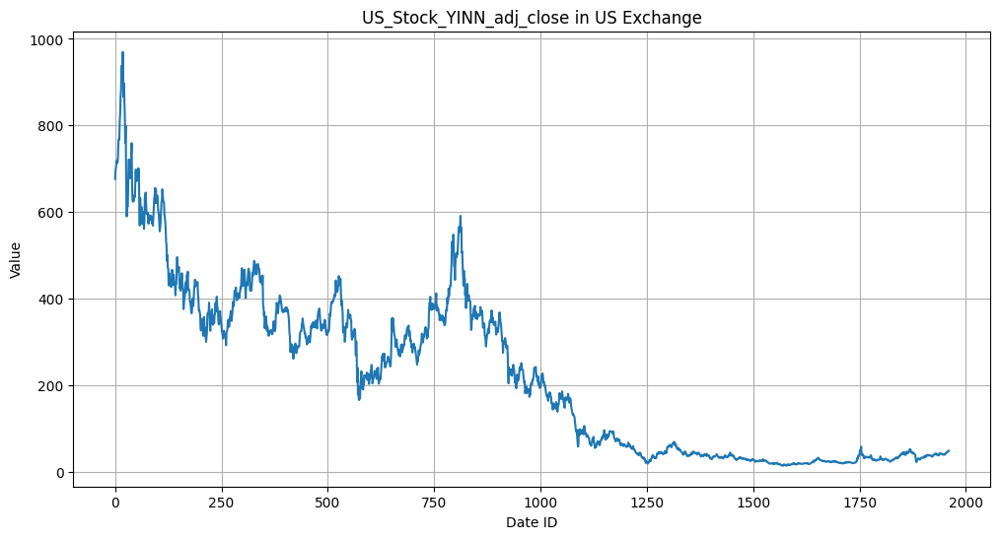


Plots for LME Exchange:


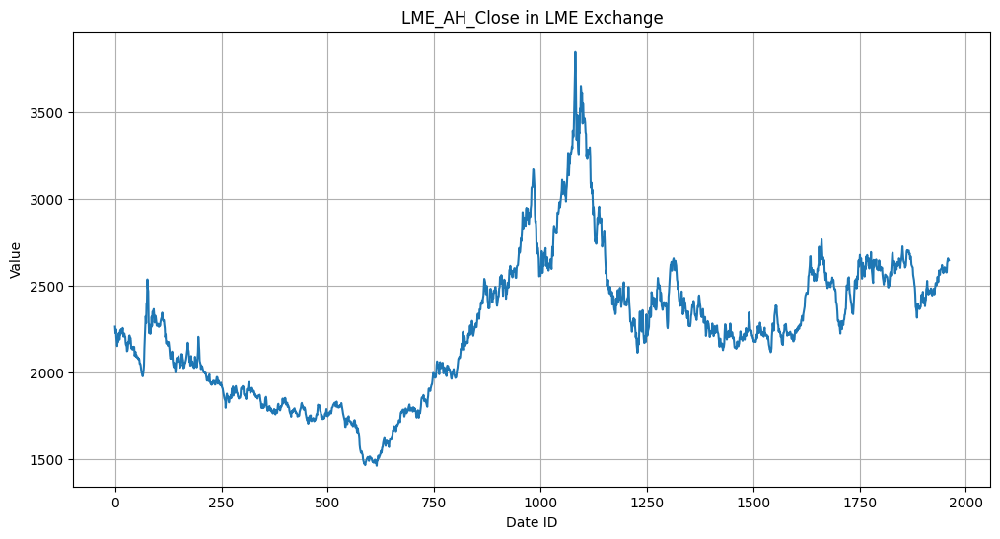

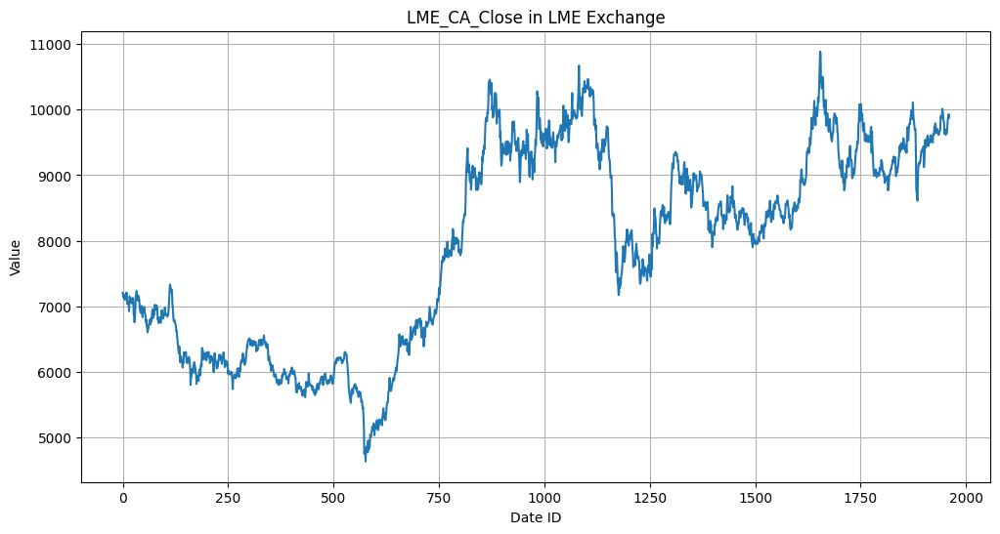

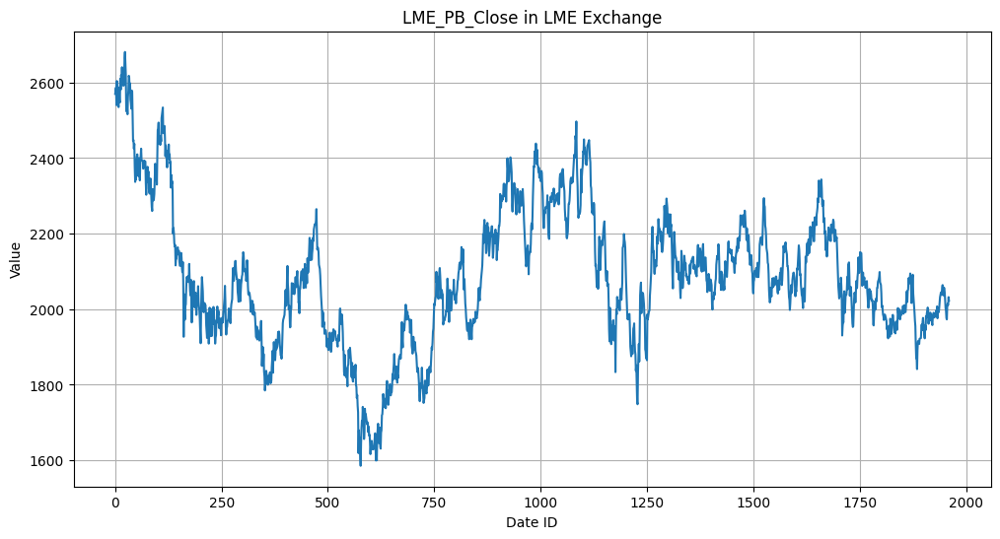

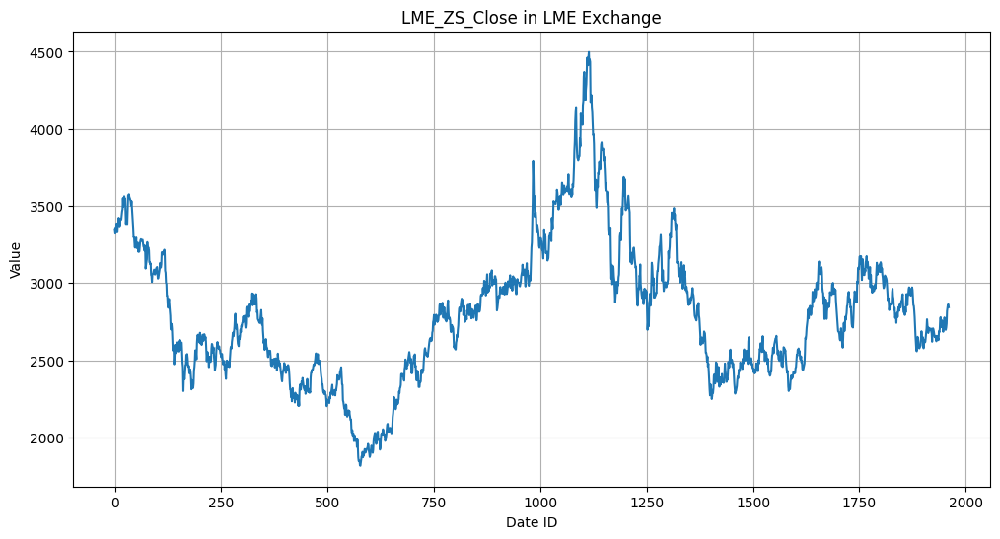


Plots for FX Exchange:


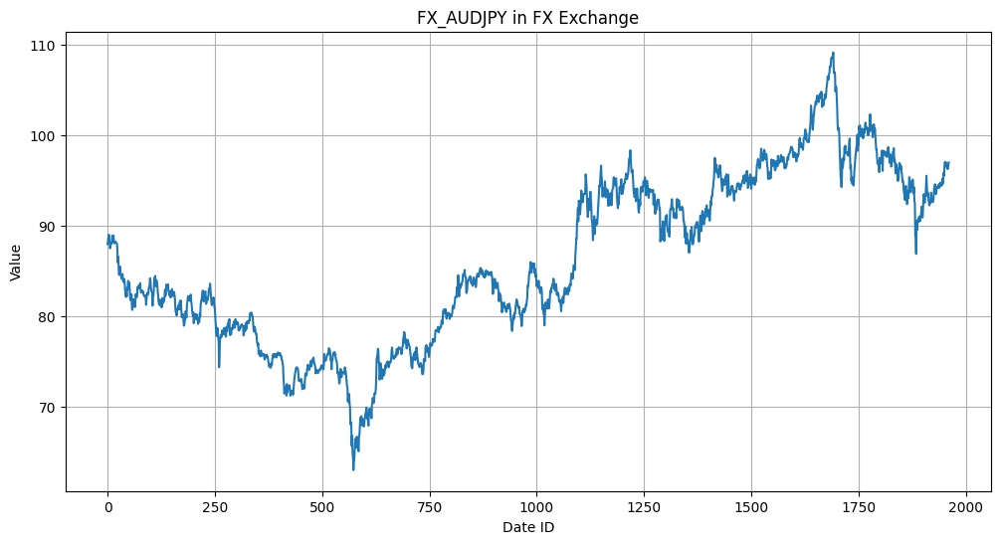

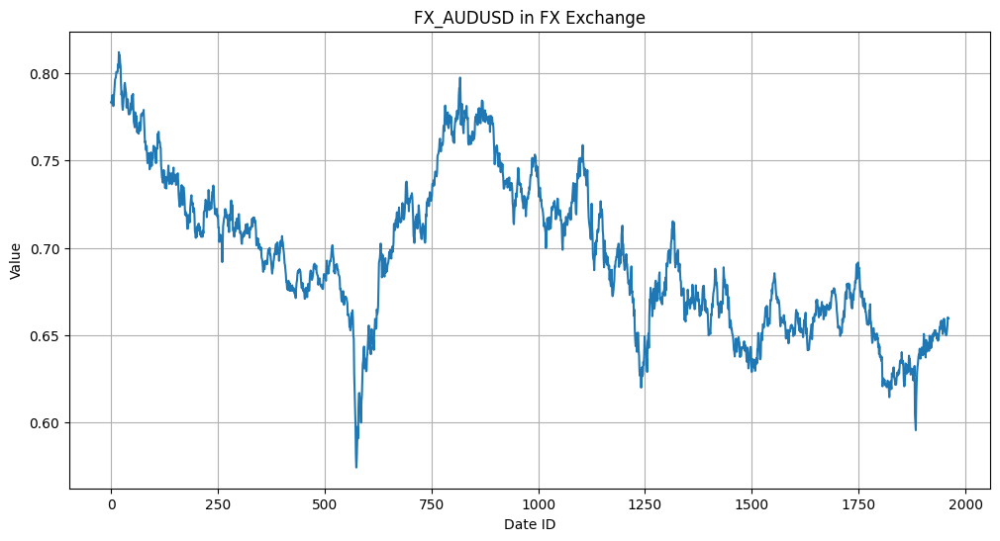

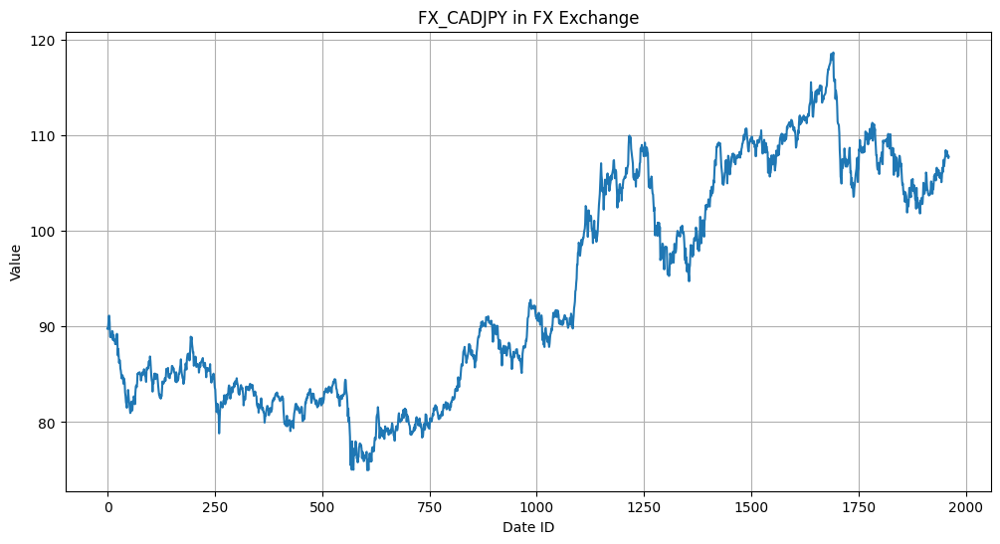

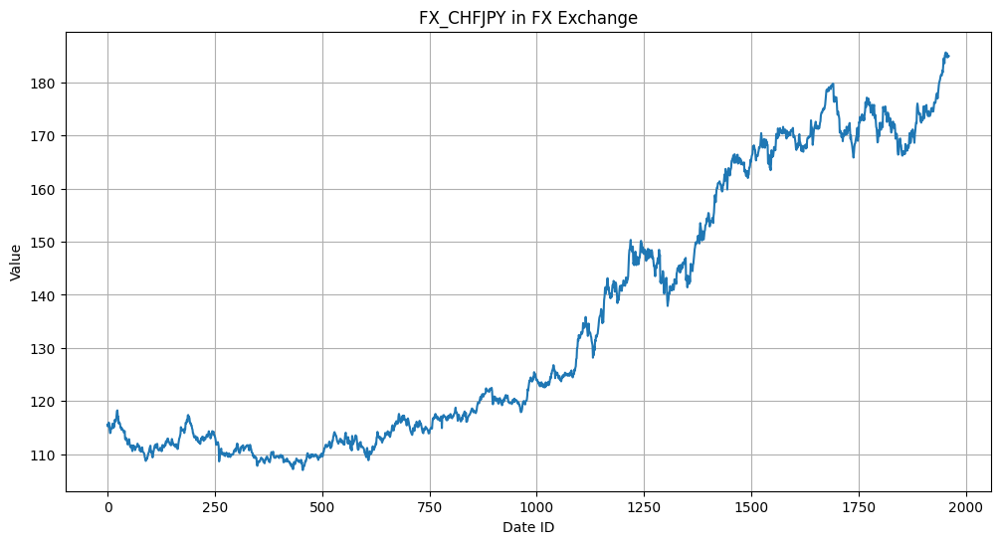

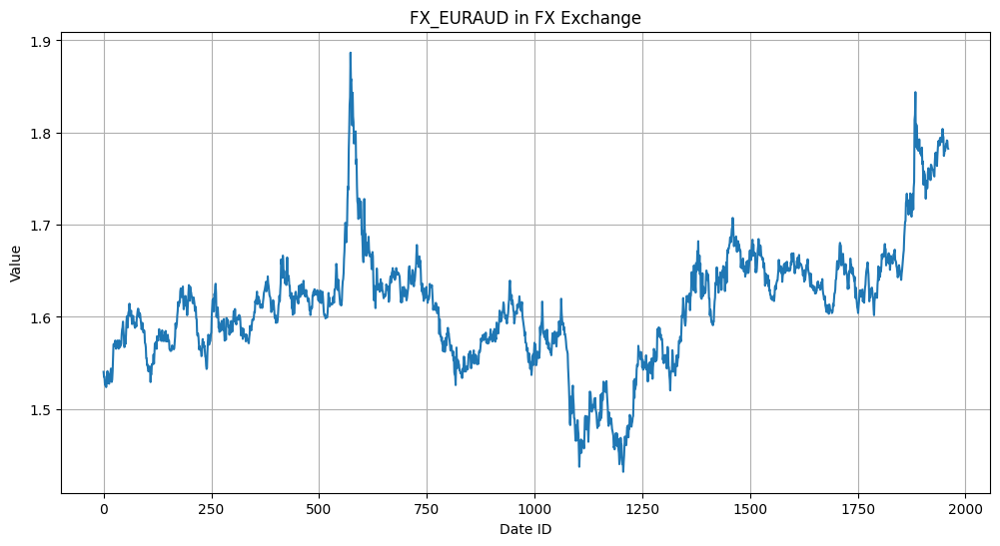

...

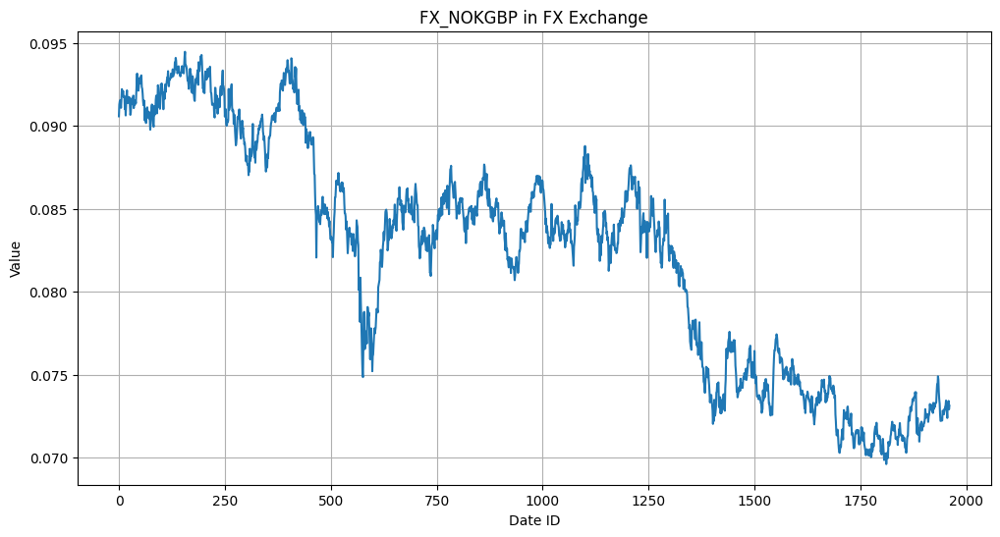

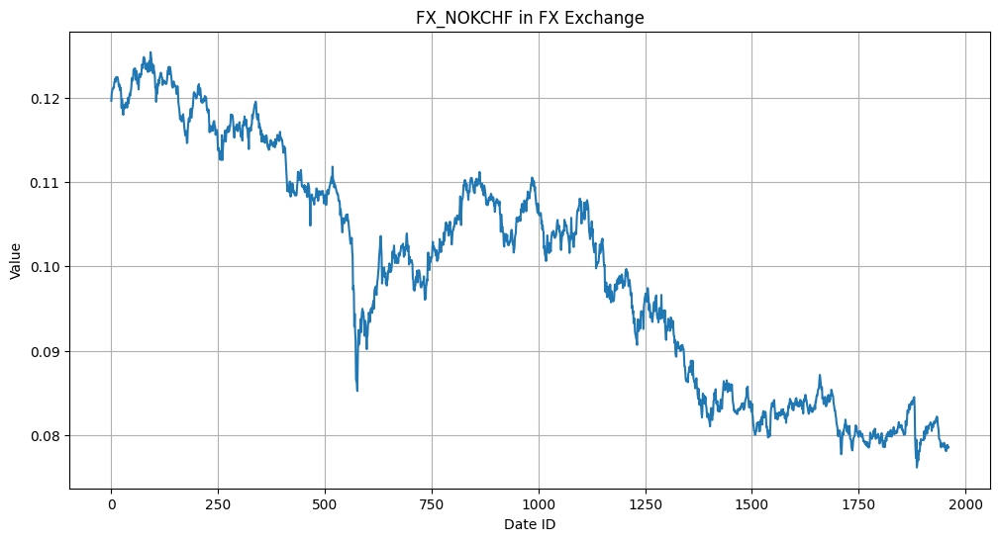

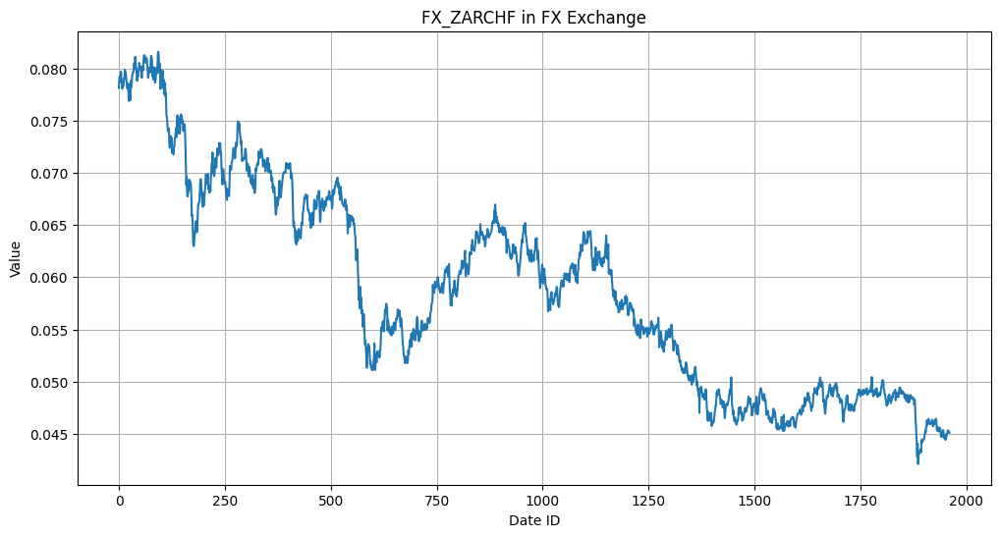

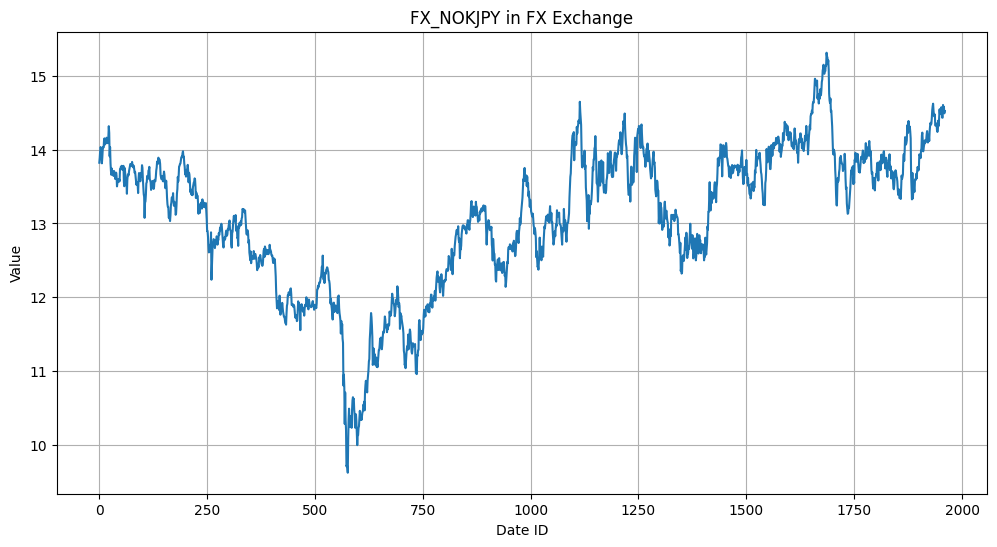

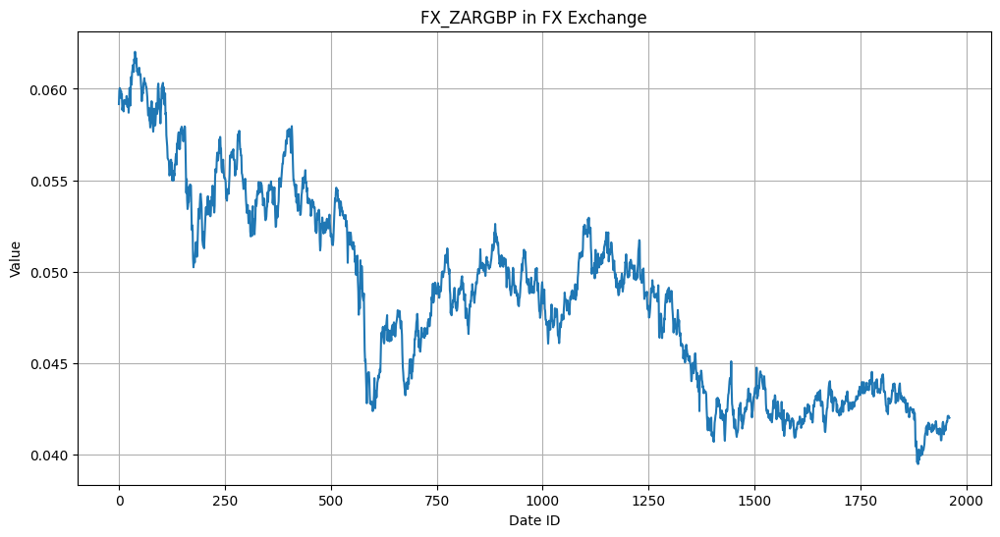


Plots for JPX Exchange:


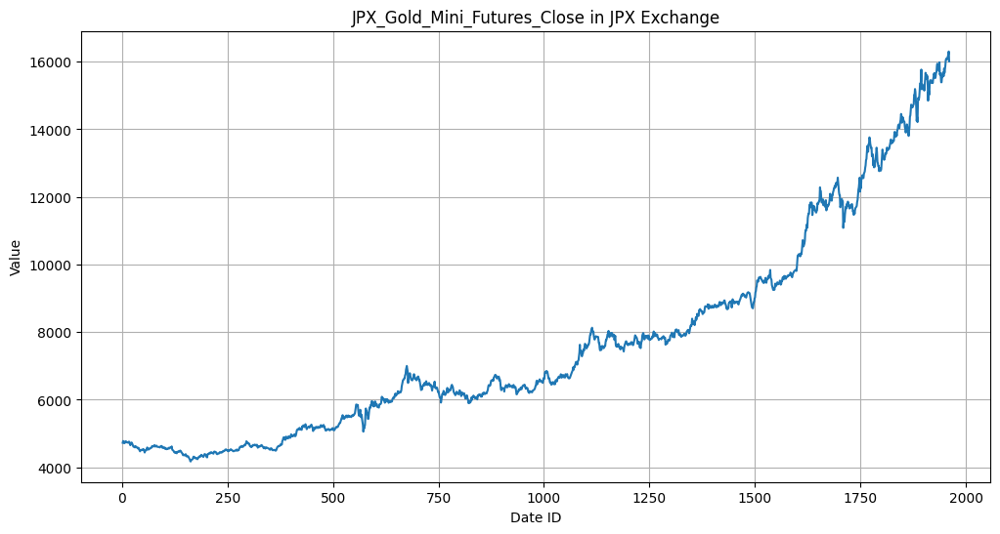

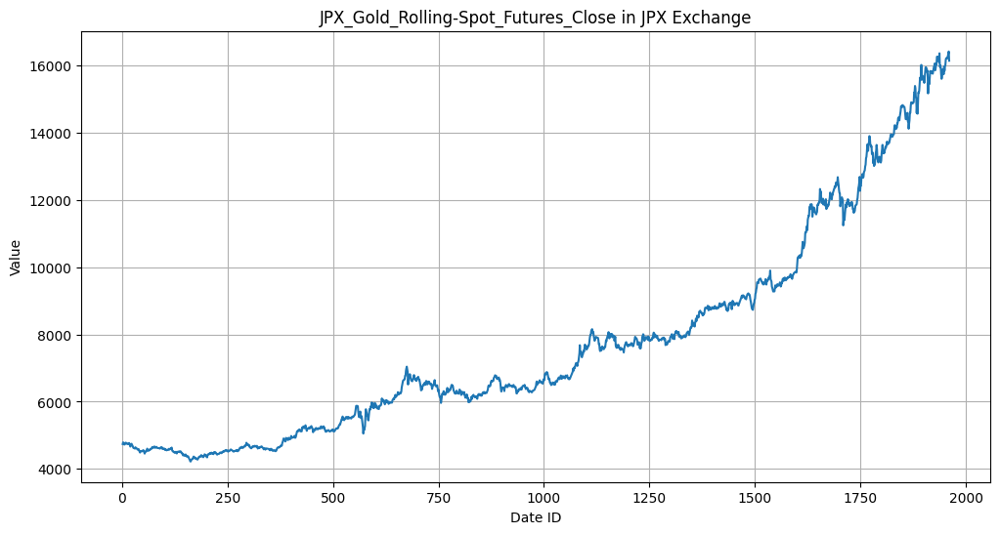

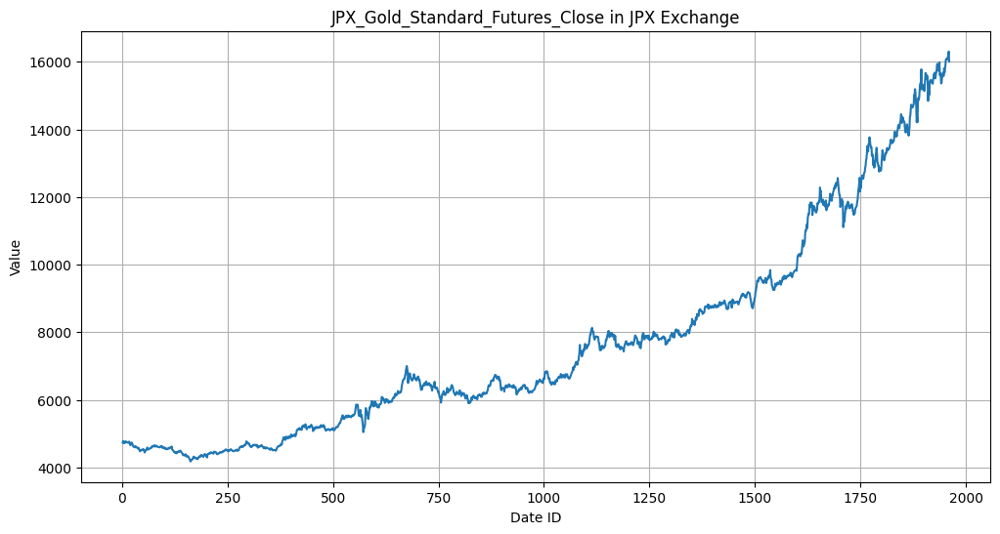

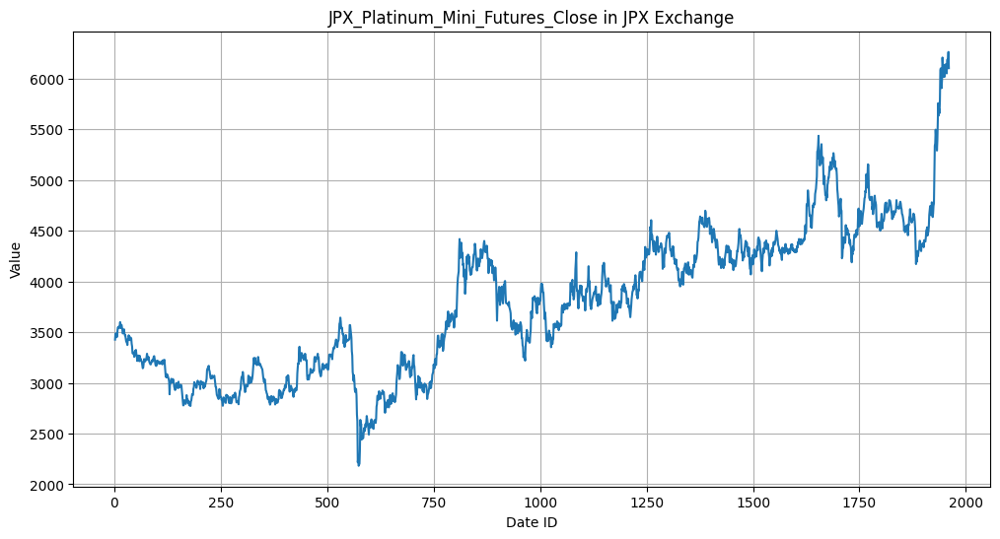

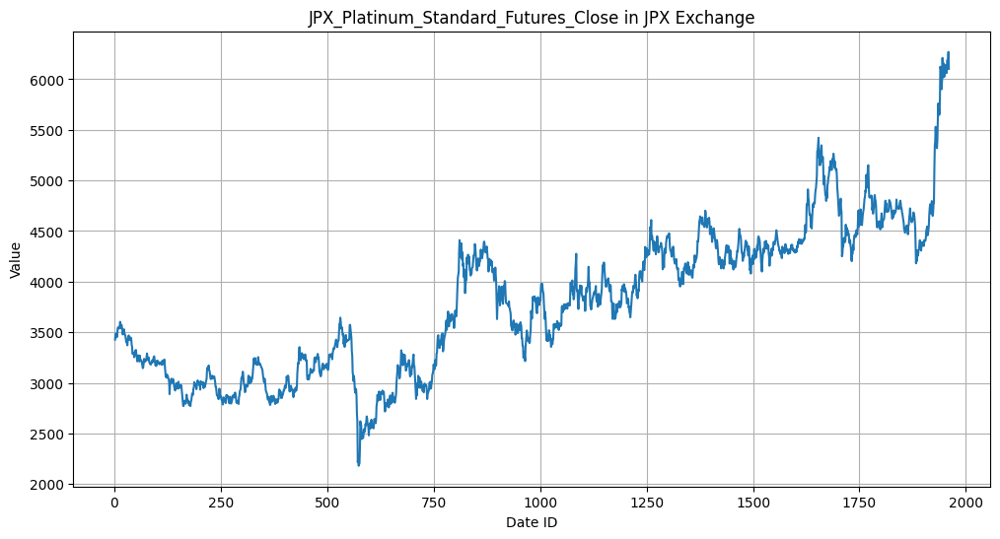

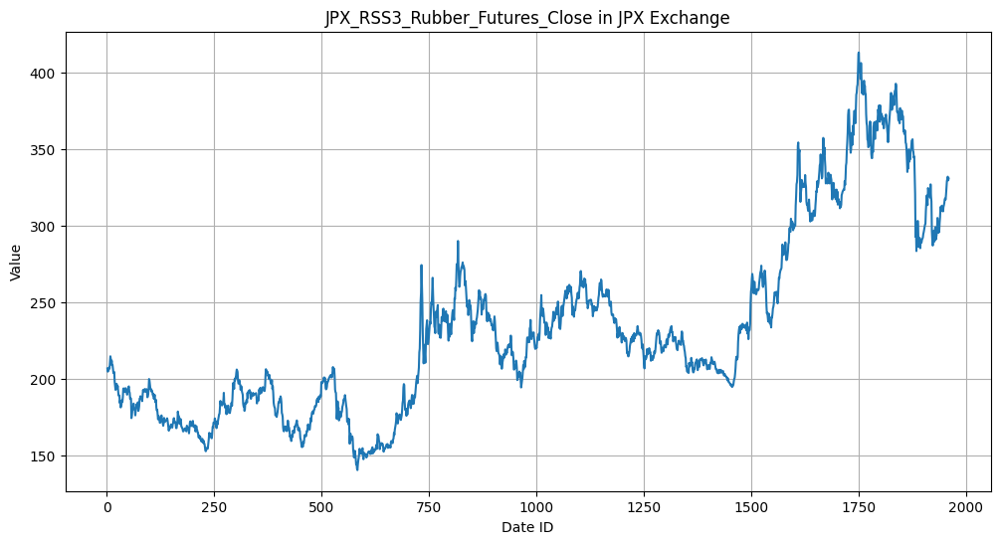

In [30]:
def plot_stock_data(df, column_name, title):
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df, x=df.index, y=column_name)
    plt.title(title)
    plt.xlabel('Date ID')
    plt.ylabel('Value')
    plt.grid(True)
    plt.show()

print("\n--- Plotting All Stocks on One Figure Per Exchange ---")
for exchange_name, df_exchange in EXCHANGES.items():
    if not df_exchange.empty:
        plt.figure(figsize=(15, 8))
        for col in df_exchange.columns:
            sns.lineplot(data=df_exchange, x=df_exchange.index, y=col, label=col)
        plt.title(f'All Stocks in {exchange_name} Exchange')
        plt.xlabel('Date ID')
        plt.ylabel('Value')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No data for {exchange_name} Exchange to plot all stocks on one figure.")

print("\n--- Plotting Individual Stock Figures Per Exchange ---")
for exchange_name, df_exchange in EXCHANGES.items():
    if not df_exchange.empty:
        print(f"\nPlots for {exchange_name} Exchange:")
        for col in df_exchange.columns:
            plot_stock_data(df_exchange, col, f'{col} in {exchange_name} Exchange')
    else:
        print(f"No data for {exchange_name} Exchange to plot individual stocks.")

In [46]:
df = pd.DataFrame()
for i in EXCHANGES:
    # print(i)
    df = pd.concat([df,EXCHANGES[i]])
df.to_csv("../data/train_selected.csv")
print("saved")

saved


In [47]:
df

,US_Stock_ACWI_adj_close,US_Stock_AEM_adj_close,US_Stock_AG_adj_close,US_Stock_AGG_adj_close,US_Stock_ALB_adj_close,US_Stock_AMP_adj_close,US_Stock_BCS_adj_close,US_Stock_BKR_adj_close,US_Stock_BND_adj_close,US_Stock_BNDX_adj_close,...,FX_NOKCHF,FX_ZARCHF,FX_NOKJPY,FX_ZARGBP,JPX_Gold_Mini_Futures_Close,JPX_Gold_Rolling-Spot_Futures_Close,JPX_Gold_Standard_Futures_Close,JPX_Platinum_Mini_Futures_Close,JPX_Platinum_Standard_Futures_Close,JPX_RSS3_Rubber_Futures_Close
date_id,,,,,,,,,,,,,,,,,,,,,
0,63.6732,39.9057,7.1317,89.5131,119.5712,146.3792,8.2270,25.9966,65.9794,43.4562,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,63.9969,39.6752,6.9539,89.5213,119.8076,145.6555,8.1972,27.0452,66.0362,43.4882,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,64.4432,40.0167,6.9638,89.4639,118.3804,146.1896,8.2419,27.9325,66.0038,43.4962,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,64.8632,40.1534,6.8749,89.4065,119.7440,146.6893,8.0331,27.7792,65.9145,43.4962,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,64.9244,40.2473,6.8353,89.3819,124.9530,148.1797,8.0853,27.8357,65.9226,43.5042,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1956,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16095.5,16223.0,16090.0,6185.0,6188.0,329.1
1957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16216.0,16345.0,16221.0,6185.0,6182.0,331.9
